In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from prophet import Prophet
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import tqdm as notebook_tqdm


d:\Edunet\EdunetEnv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df = pd.read_csv("../data/Dataset.csv")
df.head()

,Date,tmax,tmin,prcp,City,Year,Month,tavg
0,1960-01-01,37.0,24.0,0.00,Boston,1960,Jan,30.5
1,1960-01-02,47.0,23.0,0.00,Boston,1960,Jan,35.0
2,1960-01-03,57.0,37.0,0.92,Boston,1960,Jan,47.0
3,1960-01-04,41.0,33.0,0.00,Boston,1960,Jan,37.0
4,1960-01-05,37.0,27.0,0.00,Boston,1960,Jan,32.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111405 entries, 0 to 111404
Data columns (total 8 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Date    111405 non-null  object 
 1   tmax    111404 non-null  float64
 2   tmin    111404 non-null  float64
 3   prcp    111402 non-null  float64
 4   City    111405 non-null  object 
 5   Year    111405 non-null  int64  
 6   Month   111405 non-null  object 
 7   tavg    111403 non-null  float64
dtypes: float64(4), int64(1), object(3)
memory usage: 6.8+ MB


In [4]:
df['Date'] = pd.to_datetime(df['Date'])

In [5]:
cities = df['City'].unique()
cities

array(['Boston', 'Chicago', 'Los Angeles', 'New York', 'Washington DC'],
      dtype=object)

In [6]:
df['City'].value_counts()

City
Boston           22281
Chicago          22281
Los Angeles      22281
New York         22281
Washington DC    22281
Name: count, dtype: int64

In [7]:
# for city in cities:
    
#     fig,ax = plt.subplots(figsize=(10,5))
    
#     city_data = df[df["City"] == city]
    
#     avg_max_temp = df.groupby(df['Year'],df['City'])([])

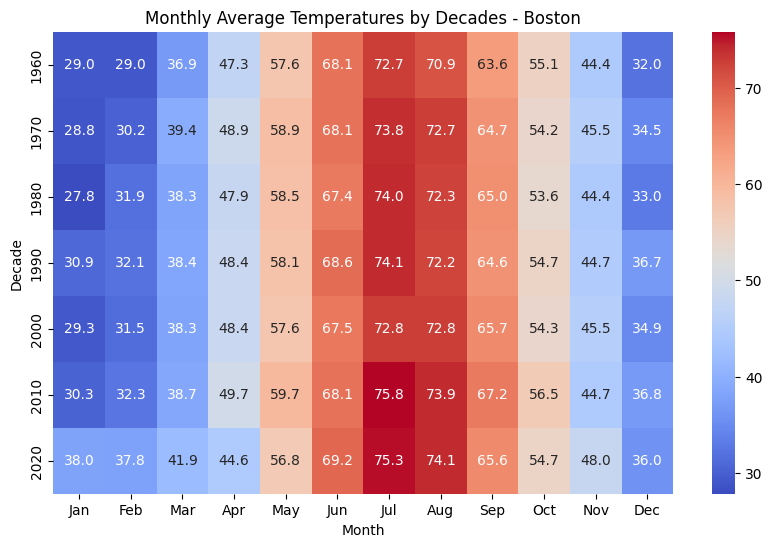

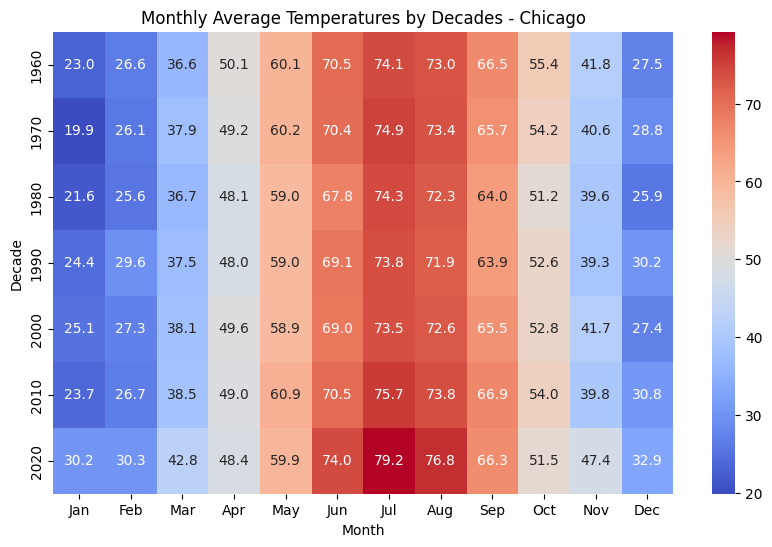

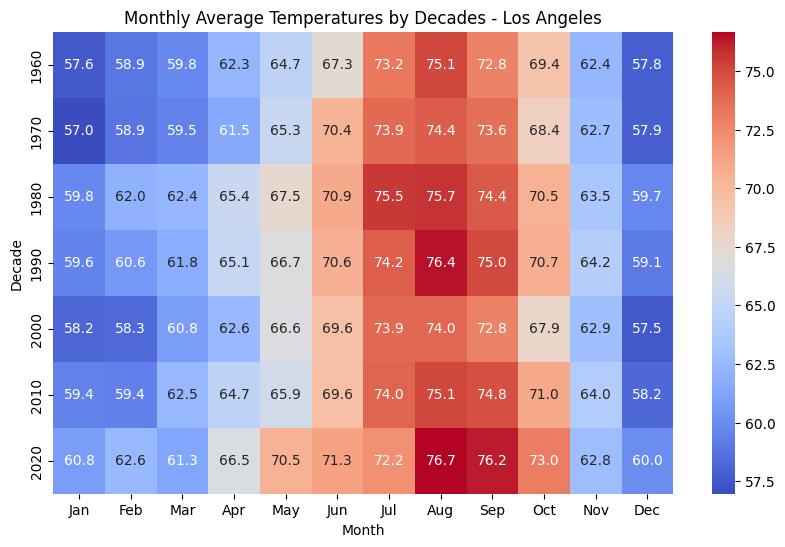

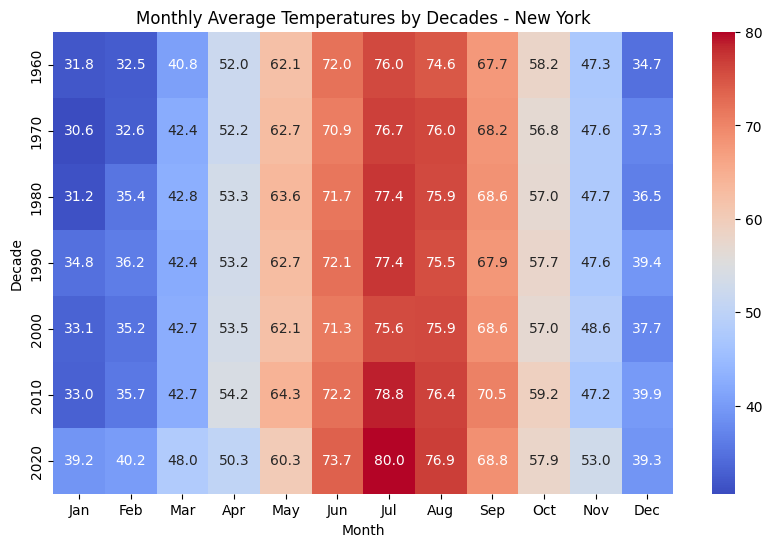

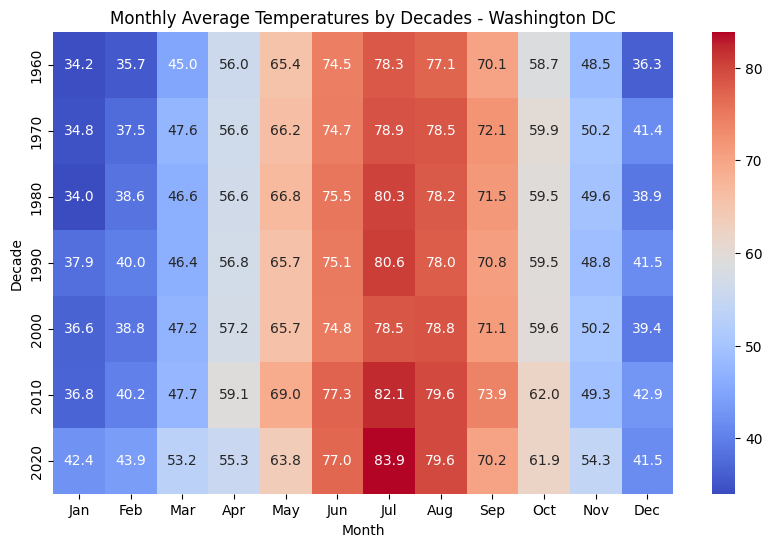

In [8]:
decades = range(df['Year'].min() // 10 * 10, df['Year'].max() // 10 * 10 + 1, 10)

# Define the order of months starting from January
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Iterate over each city
for city in cities:
    # Filter the data for the current city
    city_data = df[df['City'] == city].copy()  # Make a copy of the filtered DataFrame

    # Group by decade and month, and calculate the average temperature
    city_data['Decade'] = city_data['Year'] // 10 * 10
    avg_by_decade = city_data.groupby(['Decade', 'Month']).mean(numeric_only=True).reset_index()

    # Pivot the table to reshape the data
    pivot_table = avg_by_decade.pivot(index='Decade', columns='Month', values='tavg')

    # Rearrange the columns
    pivot_table = pivot_table[month_order]

    # Set the size of the heatmap
    plt.figure(figsize=(10, 6))

    # Create the heatmap
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".1f", cbar=True)

    # Set the title and labels
    plt.title(f"Monthly Average Temperatures by Decades - {city}")
    plt.xlabel("Month")
    plt.ylabel("Decade")

    # Show the heatmap
    plt.show()



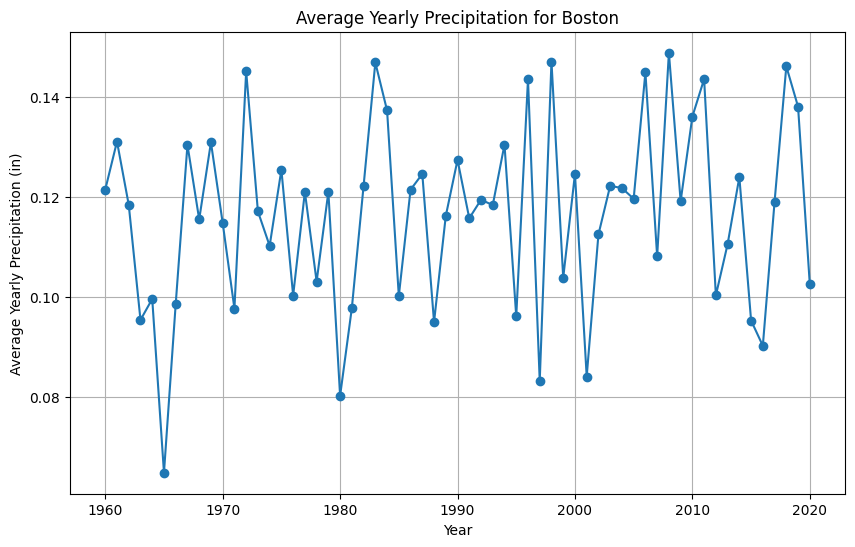

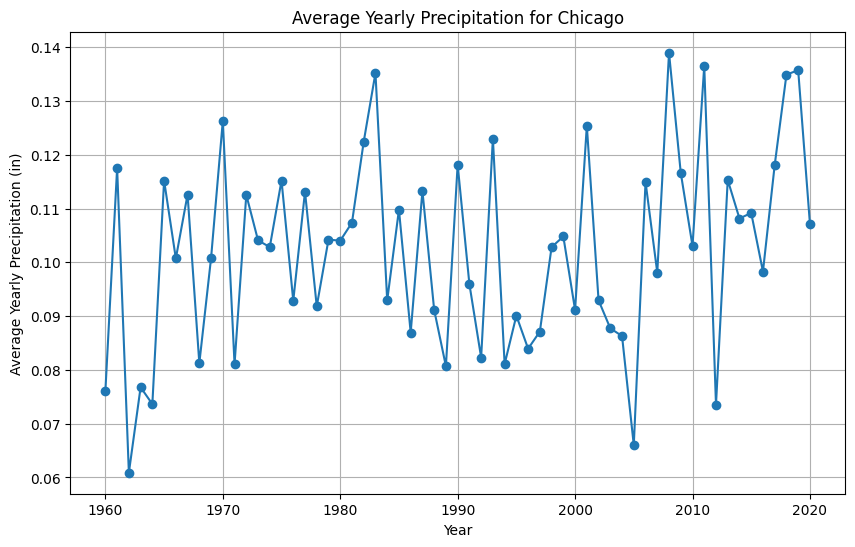

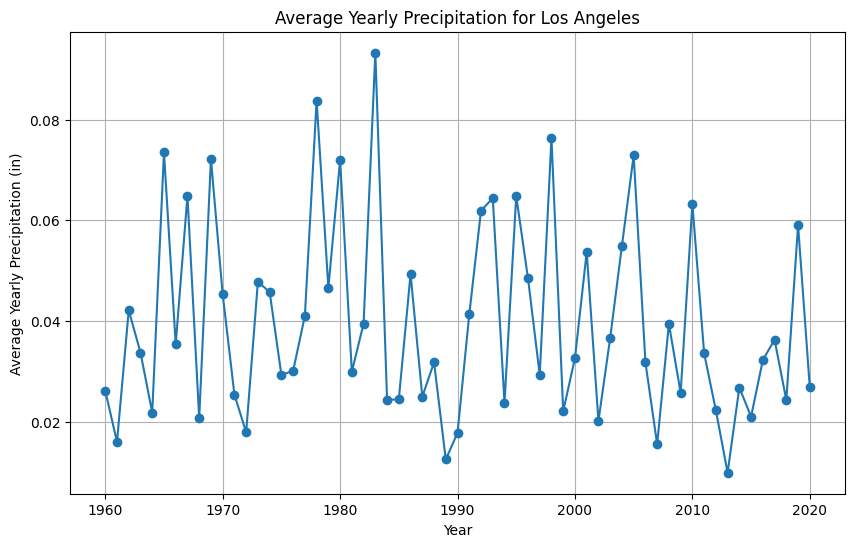

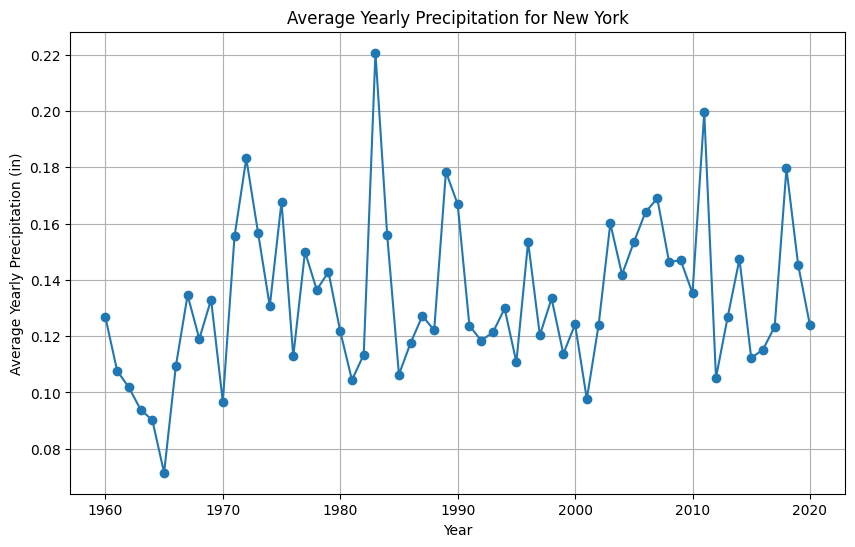

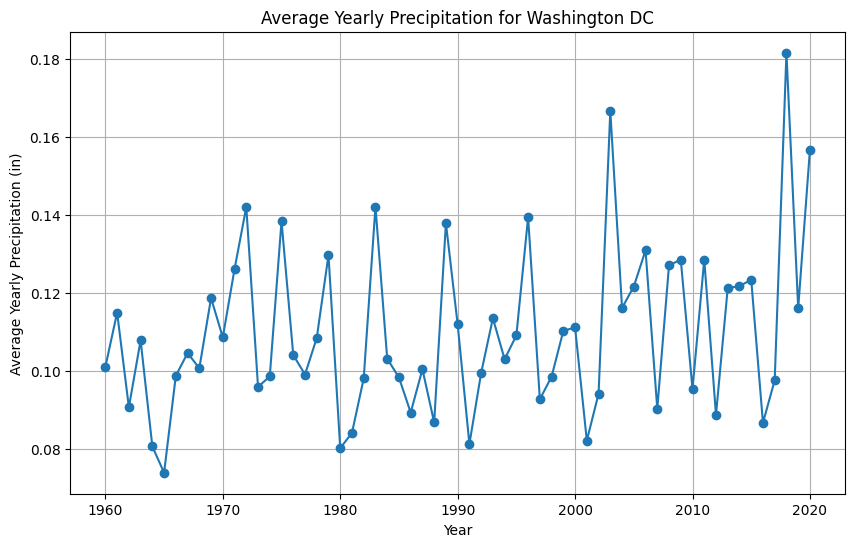

In [9]:
# Group the data by 'City' and 'Year' and calculate the average precipitation for each city and year
average_precipitation = df.groupby(['City', 'Year'])['prcp'].mean()

# Iterate over each city and create a separate plot for each
for city in cities:
    # Filter the data for the current city
    city_data = average_precipitation[city]

    # Create a list of years for the x-axis
    years = city_data.index.tolist()

    # Create a list of average precipitation values for the y-axis
    averages = city_data.tolist()

    # Set the graph size
    plt.figure(figsize=(10, 6))

    # Plot the average yearly precipitation for the current city
    plt.plot(years, averages, marker='o')

    # Set the x-axis label, y-axis label, and plot title
    plt.xlabel('Year')
    plt.ylabel('Average Yearly Precipitation (in)')
    plt.title(f'Average Yearly Precipitation for {city}')

    # Display the plot
    plt.grid(True)
    plt.show()

In [10]:
# Set the rolling window size for the moving average
rolling_window_size = 30

# Create a separate plot for each city
for city in cities:
    # Filter the data for the specific city
    city_data = df[df["City"] == city].copy()

    # Calculate the moving average of the 'tavg' column
    city_data['tavg_ma'] = city_data['tavg'].rolling(rolling_window_size).mean()

    # Create a plotly figure
    fig = go.Figure()

    # Add traces for the original temperature data and moving average
    fig.add_trace(go.Scatter(x=city_data['Date'], y=city_data['tavg'], mode='lines', name='Original Temperature'))
    fig.add_trace(go.Scatter(x=city_data['Date'], y=city_data['tavg_ma'], mode='lines', name='Moving Average'))

    # Configure the layout
    fig.update_layout(
        title=f'Temperature Data and Moving Average for {city}',
        xaxis_title='Date',
        yaxis_title='Temperature (°F)',
        hovermode='x',
        legend=dict(x=0.7, y=0.9),
        template='plotly_white'
    )

    # Show the interactive plot
    fig.show()



In [11]:
# Select the relevant columns
df = pd.DataFrame(df, columns=['Date', 'tavg', 'City'])

# Rename the columns
df.rename(columns={"Date": "ds", "tavg": "y"}, inplace=True)

10:17:45 - cmdstanpy - INFO - Chain [1] start processing
10:17:50 - cmdstanpy - INFO - Chain [1] done processing


<Figure size 1000x600 with 0 Axes>

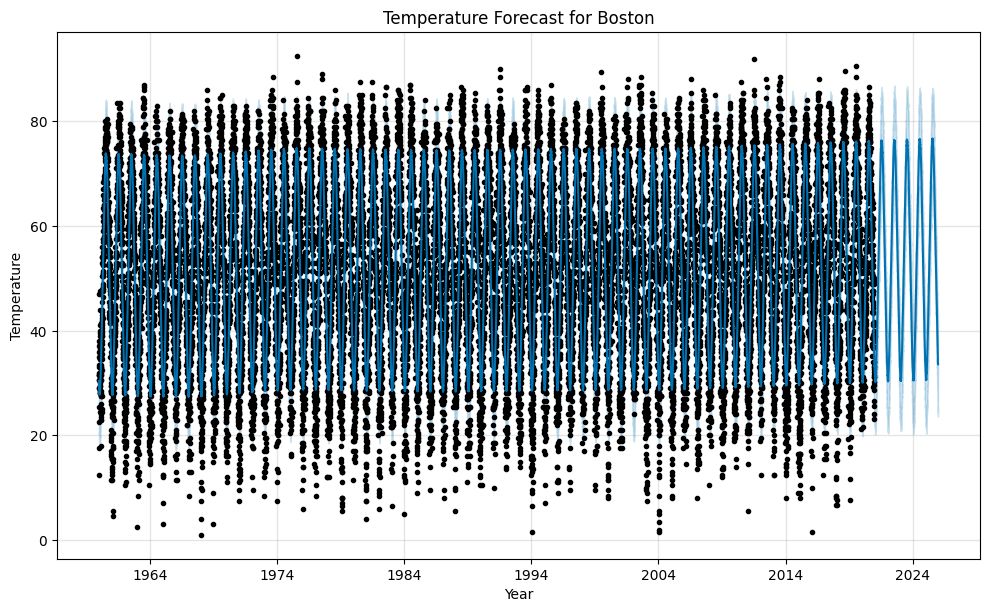

10:17:55 - cmdstanpy - INFO - Chain [1] start processing
10:17:58 - cmdstanpy - INFO - Chain [1] done processing


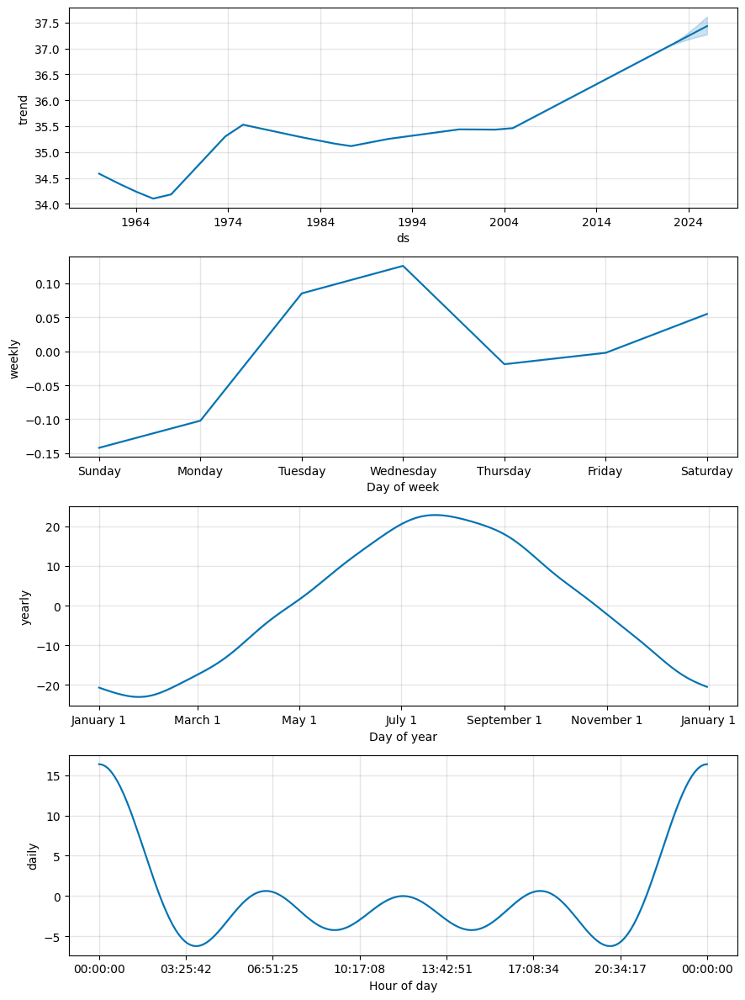

<Figure size 1000x600 with 0 Axes>

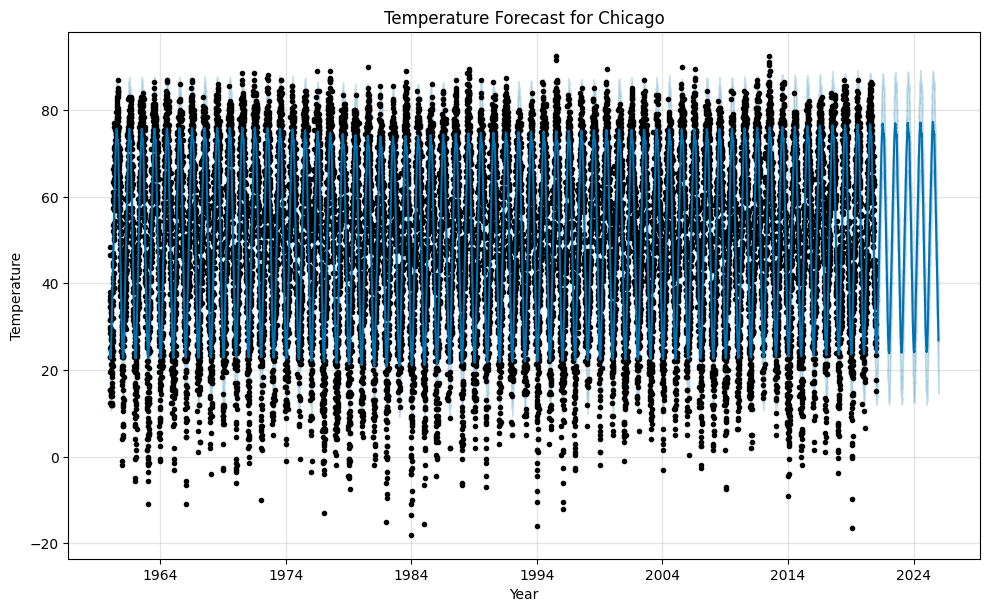

10:18:03 - cmdstanpy - INFO - Chain [1] start processing
10:18:10 - cmdstanpy - INFO - Chain [1] done processing


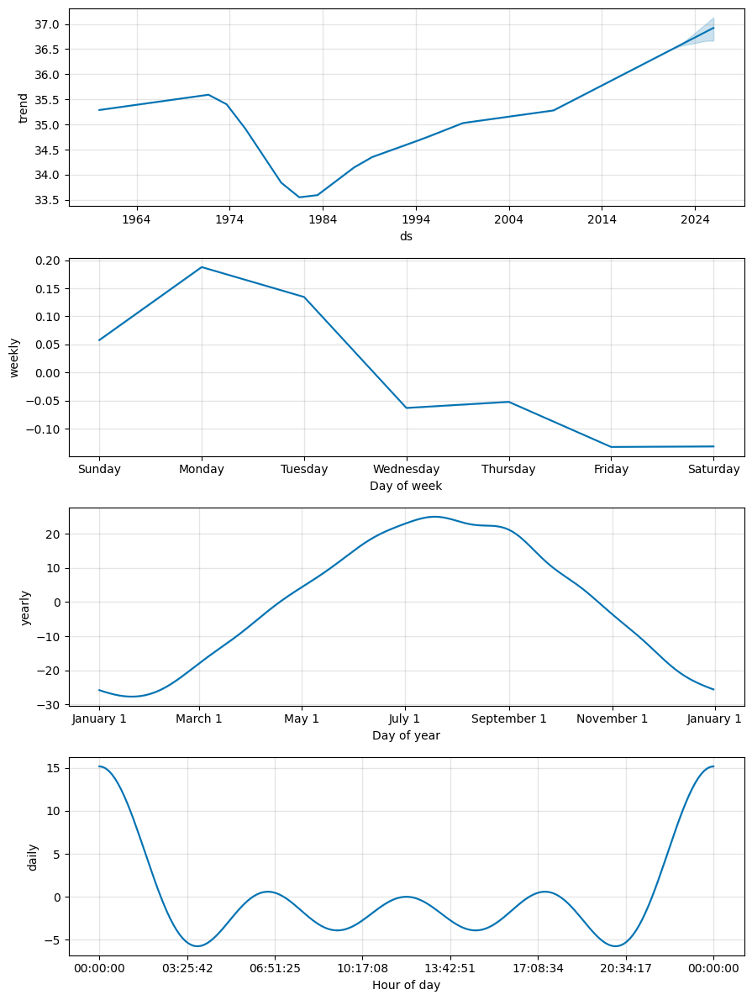

<Figure size 1000x600 with 0 Axes>

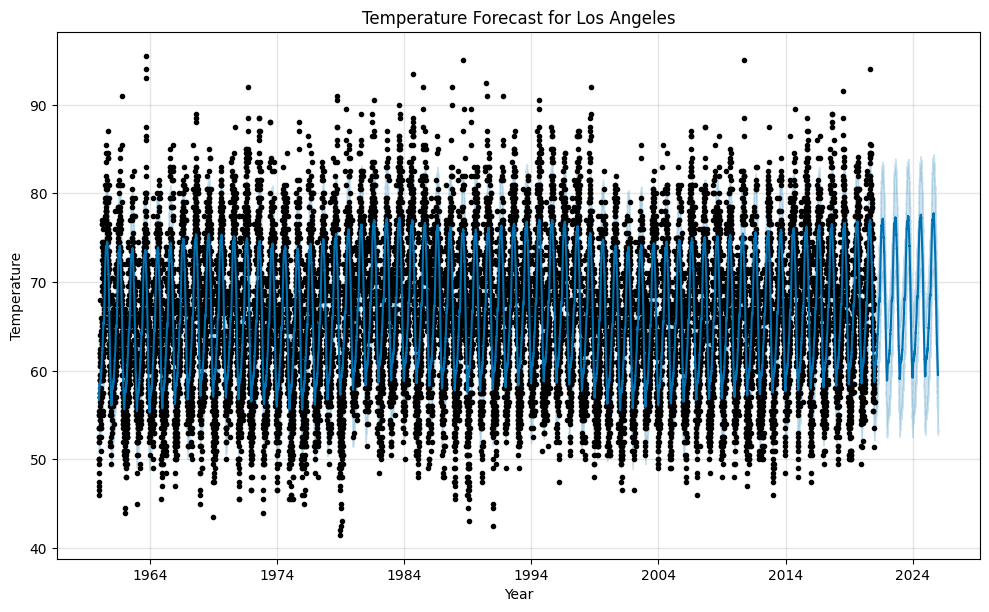

10:18:15 - cmdstanpy - INFO - Chain [1] start processing
10:18:18 - cmdstanpy - INFO - Chain [1] done processing


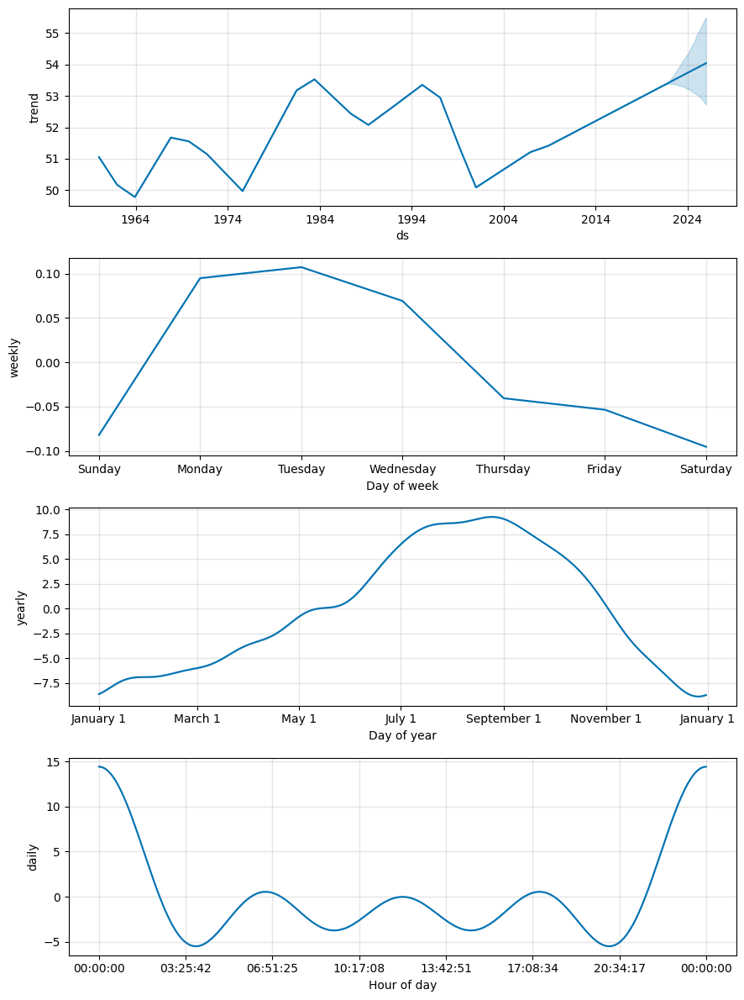

<Figure size 1000x600 with 0 Axes>

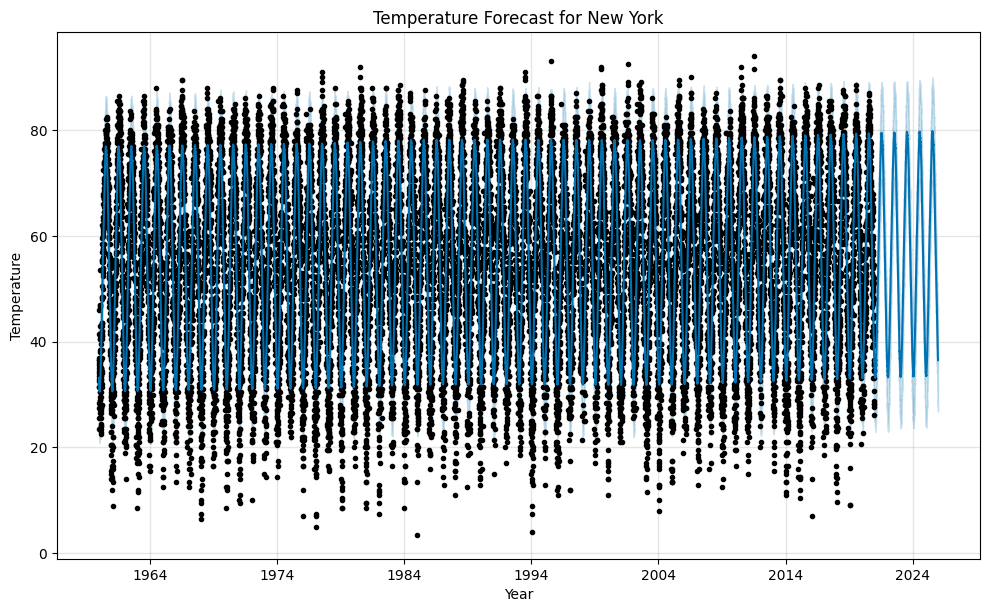

10:18:23 - cmdstanpy - INFO - Chain [1] start processing
10:18:27 - cmdstanpy - INFO - Chain [1] done processing


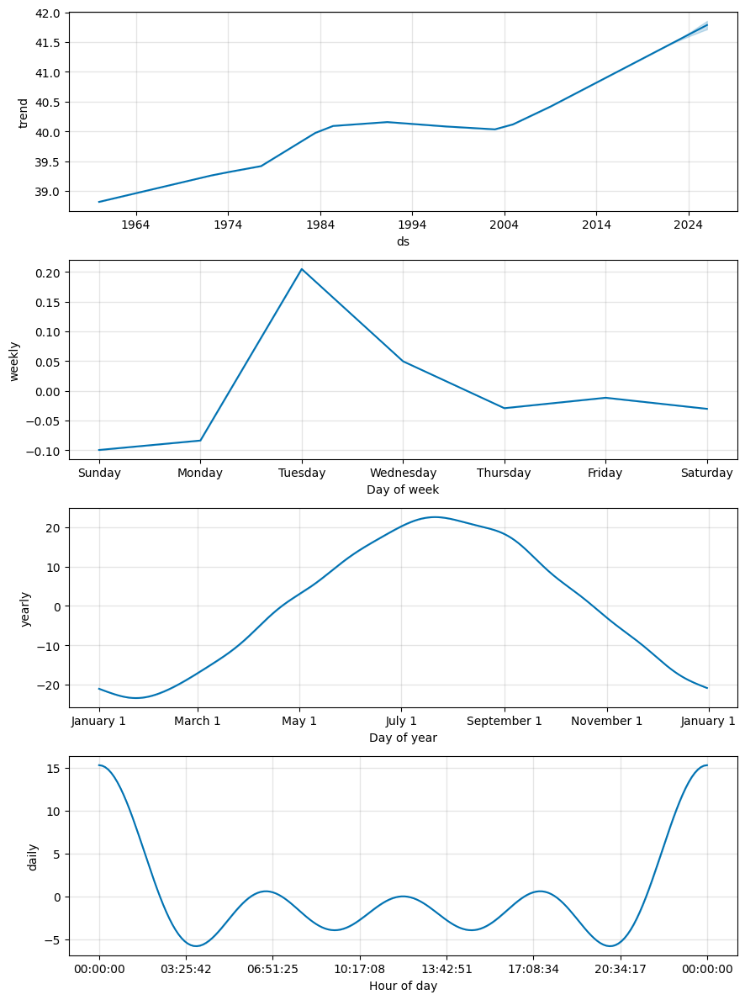

<Figure size 1000x600 with 0 Axes>

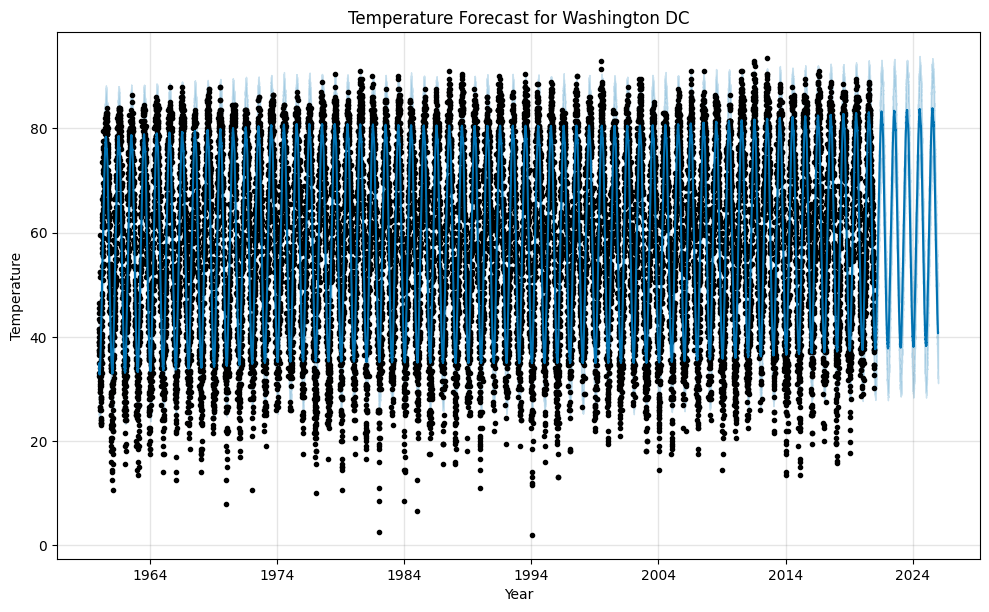

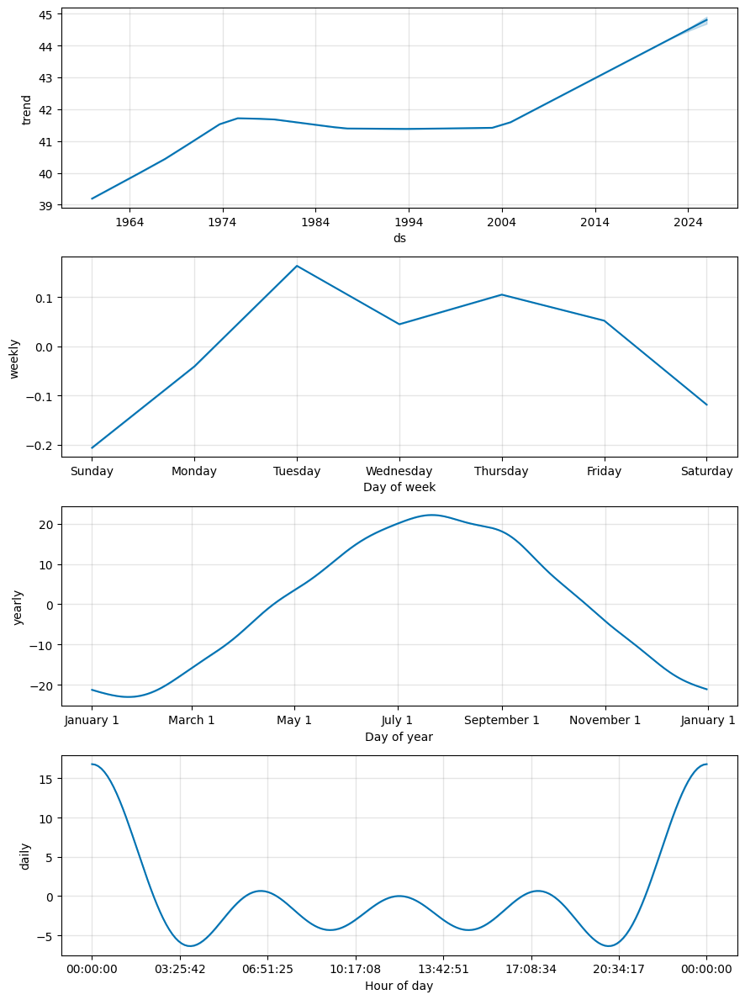

In [12]:
# Iterate over each city and create a separate graph for each
for city in cities:
    # Filter the data for the current city
    city_data = df[df['City'] == city]

    # Create a Prophet model
    model = Prophet(daily_seasonality=True)

    # Fit the model with the city-specific data
    model.fit(city_data)

    # Generate future dates for prediction (next five years)
    future_dates = model.make_future_dataframe(periods=365*5)

    # Make predictions for the future dates
    forecast = model.predict(future_dates)

    # Set the graph size
    plt.figure(figsize=(10, 6))

    # Plot the overall trend
    model.plot(forecast, xlabel='Year', ylabel='Temperature')

    # Set the plot title
    plt.title(f'Temperature Forecast for {city}')

    # Display the plot
    plt.show()

    # Plot the components: trend, yearly seasonality, and weekly seasonality
    fig = model.plot_components(forecast)


In [13]:
(df[df['City'] == 'New York']['y'].unique()).mean

<function ndarray.mean>